### Задание

1) Модифицируйте код и реализуйте [Wasserstein GAN](https://arxiv.org/abs/1701.07875) ([From GAN to WGAN
](https://lilianweng.github.io/posts/2017-08-20-gan/)) используя weight clipping. (1 балл)

2) Замените  weight clipping на [gradient penalty](https://arxiv.org/pdf/1704.00028v3.pdf). (1 балл)

3) Добавьте к обучению WGAN условие на метку, продемонстрируйте [условную генерацию](https://arxiv.org/pdf/1411.1784.pdf).  (1 балл) 

Напишите отчет о том, что попробовали, какие результаты получили, какую архитектуру использовали, как вам кажется надо обучать GAN, чтобы добиться сходимости? Каждый пункт обязательно сопроводите визуализациями.

### Студент: Бекетов Роман ML-21

In [66]:
#!rm -rf report.zip

In [67]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1ZekLeu6latYJauHST813k6dEmIg-wLK2' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1ZekLeu6latYJauHST813k6dEmIg-wLK2" -O report.zip && rm -rf /tmp/cookies.txt
!unzip report.zip

--2023-12-03 23:58:04--  https://docs.google.com/uc?export=download&confirm=&id=1ZekLeu6latYJauHST813k6dEmIg-wLK2
Resolving docs.google.com (docs.google.com)... 74.125.135.100, 74.125.135.113, 74.125.135.138, ...
Connecting to docs.google.com (docs.google.com)|74.125.135.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-38-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9a5ummco1p8o1shju5dkqv4d4gdo58jv/1701647850000/09074642392443333439/*/1ZekLeu6latYJauHST813k6dEmIg-wLK2?e=download&uuid=664308e7-bedf-43bb-a856-5eaf6df8a922 [following]
--2023-12-03 23:58:05--  https://doc-0s-38-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9a5ummco1p8o1shju5dkqv4d4gdo58jv/1701647850000/09074642392443333439/*/1ZekLeu6latYJauHST813k6dEmIg-wLK2?e=download&uuid=664308e7-bedf-43bb-a856-5eaf6df8a922
Resolving doc-0s-38-docs.googleusercontent.com (doc-0s-38-docs.googleusercontent.com)... 74.125.135.132, 2

In [1]:
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset


import matplotlib.pyplot as plt
import numpy as np

from torch.autograd import Variable


from torchvision.utils import make_grid
from __future__ import print_function
import argparse
import os
import pickle
import random

import torch.nn.parallel
import torch.backends.cudnn as cudnn


import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 1337
#manualSeed = random.randint(1, 10000) # use if you want new results
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [2]:
from PIL import Image

In [3]:
def tensor_to_image(tensor, size=(256, 256)):
    if len(tensor.shape) == 4:
        tensor = tensor[0]
    tensor = ((tensor + 1) / 2).clamp(0, 1)
    pil_image = transforms.ToPILImage()((255 * tensor.cpu().detach()).to(torch.uint8))
    resized_image = pil_image.resize(size, Image.LANCZOS)
    return resized_image

In [4]:
class Config:
    pass

config = Config()
config.mnist_path = None
config.batch_size = 32
config.num_workers = 3
config.num_epochs = 20
config.print_freq = 100
config.image_size = 28
# Number of channels in the training images. For color images this is 3
config.nc = 1
# Size of z latent vector (i.e. size of generator input)
config.nz = 100
# Size of feature maps in generator
config.ngf = 28
# Size of feature maps in discriminator
config.ndf = 28
# Learning rate for optimizers
config.lr = 0.0002
# Beta1 hyperparam for Adam optimizers
config.beta1 = 0.5
# Number of GPUs available. Use 0 for CPU mode.
config.ngpu = 1

config.clip_value = 0.01

In [5]:
train = torchvision.datasets.FashionMNIST(
    "fashion_mnist",
    train=True,
    transform=transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5), (0.5)),
    ]),
    download=True
)

100%|██████████| 26421880/26421880 [00:01<00:00, 14251878.65it/s]


Extracting fashion_mnist/FashionMNIST/raw/train-images-idx3-ubyte.gz to fashion_mnist/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 211396.56it/s]


Extracting fashion_mnist/FashionMNIST/raw/train-labels-idx1-ubyte.gz to fashion_mnist/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3922871.84it/s]


Extracting fashion_mnist/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to fashion_mnist/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 10431051.69it/s]

Extracting fashion_mnist/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to fashion_mnist/FashionMNIST/raw



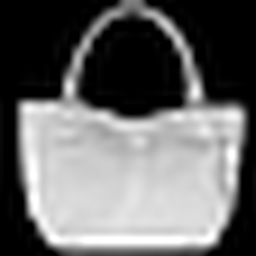

In [6]:
tensor_to_image(train[100][0])

In [7]:
dataloader = DataLoader(
    train,
    batch_size=config.batch_size,
    shuffle=True,
    num_workers=config.num_workers
)


In [8]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and config.ngpu > 0) else "cpu")

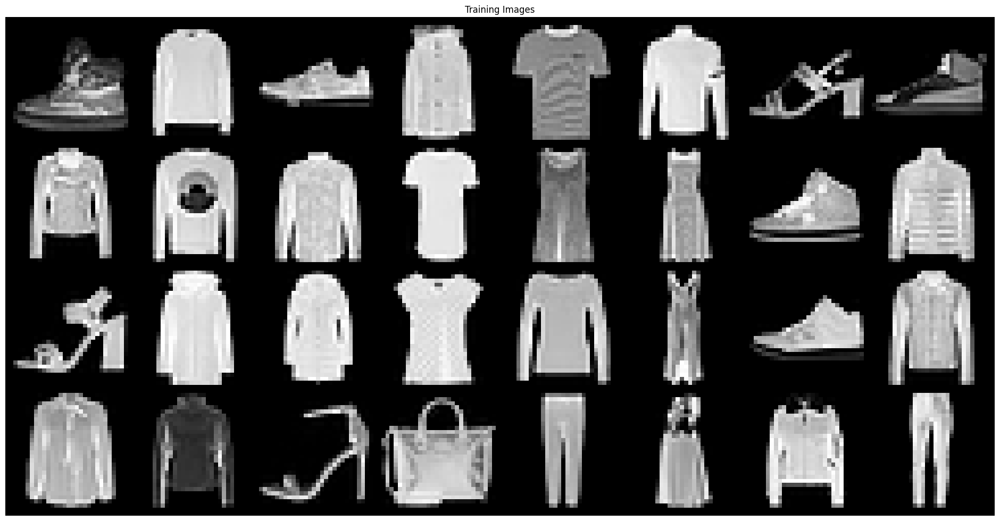

In [9]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(24,24))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [10]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

$H_{\text{out}} = (H_{\text{in}} - 1) \times \text{stride} - 2 \times \text{padding} +  \text{kernel_size}$


In [11]:
class Generator(nn.Module):
    def __init__(self, ngpu=config.ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(config.nz, config.ngf * 2, 7, 1, 0, bias=False),
            nn.BatchNorm2d(config.ngf * 2),
            nn.ReLU(True),
            # (1 - 1)*1 - 2*0 + 7
            # state size. (ngf*2) x 7 x 7
            
            nn.ConvTranspose2d(config.ngf * 2, config.ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(config.ngf),
            nn.ReLU(True),
            # (7-1)*2 - 2 + 4 = 12 - 2 + 4 = 14
            # state size. (ngf*4) x 14 x 14
            nn.ConvTranspose2d( config.ngf, config.nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # (14 - 1)*2 -2 +4 = 26 + 2 = 28
            # state size. (nc) x 28 x 28
        )

    def forward(self, input):
        return self.main(input)

In [12]:
class Discriminator(nn.Module):
    def __init__(self, ngpu=config.ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 28 x 28
            nn.Conv2d(config.nc, config.ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 14 x 14
    
            nn.Conv2d(config.ndf, config.ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(config.ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 7 x 7

            nn.Conv2d(config.ndf * 2, 1, 7, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [23]:
# Create the generator
netG = Generator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (config.ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(50, 56, kernel_size=(7, 7), stride=(1, 1), bias=False)
    (1): BatchNorm2d(56, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(56, 28, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(28, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(28, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): Tanh()
  )
)


In [24]:
# Create the Discriminator
netD = Discriminator().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (config.ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 28, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(28, 56, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(56, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(56, 1, kernel_size=(7, 7), stride=(1, 1), bias=False)
    (6): Sigmoid()
  )
)


In [76]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(config.batch_size, config.nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=config.lr, betas=(config.beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=config.lr, betas=(config.beta1, 0.999))

## Training Loop with clipping

In [16]:
def gradient_clipping(parameters):
    for param in parameters:
        if param.grad is not None:
            param.grad.data = torch.clamp(param.grad.data, -config.clip_value, config.clip_value)
  

In [17]:
# Training Loop with clipping

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(config.num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()
        
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, config.nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
    

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        
        
        # Update D
        optimizerD.step()
        
        # clipping
        gradient_clipping(netD.parameters())
       
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G

        optimizerG.step()
        gradient_clipping(netG.parameters())
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, config.num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == config.num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/20][0/1875]	Loss_D: 1.6216	Loss_G: 0.8200	D(x): 0.3904	D(G(z)): 0.4608 / 0.4483
[0/20][50/1875]	Loss_D: 0.5528	Loss_G: 1.4916	D(x): 0.8318	D(G(z)): 0.2674 / 0.2348
[0/20][100/1875]	Loss_D: 0.6927	Loss_G: 1.2434	D(x): 0.6802	D(G(z)): 0.2463 / 0.2984
[0/20][150/1875]	Loss_D: 0.5482	Loss_G: 1.3771	D(x): 0.7429	D(G(z)): 0.2013 / 0.2653
[0/20][200/1875]	Loss_D: 0.4907	Loss_G: 1.7085	D(x): 0.8168	D(G(z)): 0.2420 / 0.1950
[0/20][250/1875]	Loss_D: 0.5861	Loss_G: 1.6911	D(x): 0.7920	D(G(z)): 0.2881 / 0.1916
[0/20][300/1875]	Loss_D: 0.4920	Loss_G: 1.9143	D(x): 0.8106	D(G(z)): 0.2341 / 0.1573
[0/20][350/1875]	Loss_D: 0.4950	Loss_G: 1.5321	D(x): 0.7749	D(G(z)): 0.1948 / 0.2301
[0/20][400/1875]	Loss_D: 0.4717	Loss_G: 1.9039	D(x): 0.8387	D(G(z)): 0.2496 / 0.1560
[0/20][450/1875]	Loss_D: 0.4828	Loss_G: 2.1623	D(x): 0.8938	D(G(z)): 0.2942 / 0.1284
[0/20][500/1875]	Loss_D: 0.3821	Loss_G: 1.9297	D(x): 0.8343	D(G(z)): 0.1714 / 0.1576
[0/20][550/1875]	Loss_D: 0.3258	Loss_G: 2.

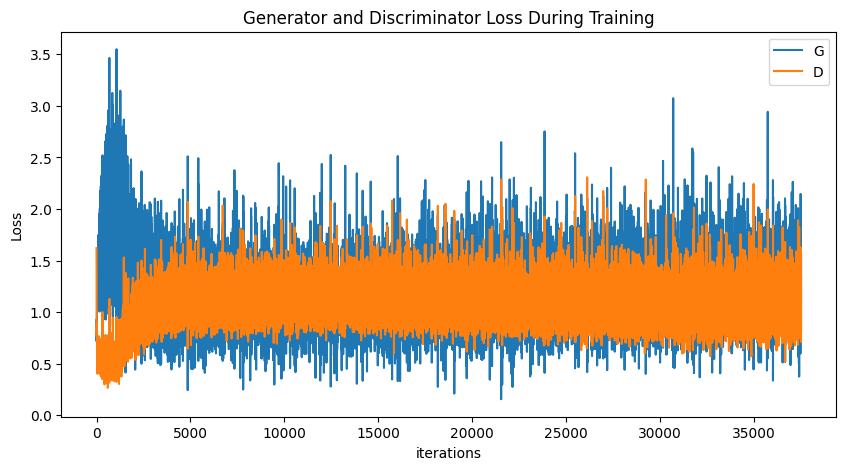

In [21]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

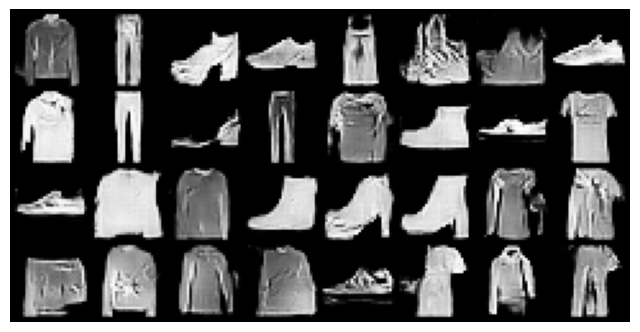

In [22]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Training Loop with gradient_penalty

In [21]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    crit_loss = torch.mean(crit_fake_pred - crit_real_pred) + c_lambda * gp
    return crit_loss

In [22]:
def get_gen_loss(crit_fake_pred):
    gen_loss = -1. * torch.mean(crit_fake_pred)
    return gen_loss

In [156]:

c_lambda = 10
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

        
gen = Generator().to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))

crit  = Discriminator().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

In [23]:
def gradient_penalty(gradient):    
    gradient = gradient.view(len(gradient), -1)

    gradient_norm = gradient.norm(2, dim=1)
    
    penalty = torch.mean((gradient_norm - 1)**2)
    
    return penalty


In [24]:
def get_gradient(crit, real, fake, epsilon):

    mixed_images = real * epsilon + fake * (1 - epsilon)

    mixed_scores = crit(mixed_images)
    
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
        
    )[0]
    return gradient

In [25]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), show_fig=False, epoch=0):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.axis('off')
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show_fig:
        plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
        
    plt.show()

![algo_penalty](./report/algo_penalty.png)

Starting Training Loop...
Epoch: 0/10 Steps:1875/1875	Epoch_Run_Time: 60.050348	Loss_C : -0.663640	Loss_G : -0.163646	
Epoch: 0/10 Total Steps:1875	Total_Time : 60.103264	Loss_C : -0.663640	Loss_G : -0.163646	Loss_C_Mean : -0.335350	Loss_G_Mean : -0.210214	


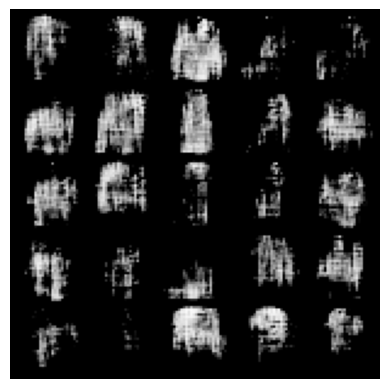

Epoch: 1/10 Steps:1875/1875	Epoch_Run_Time: 60.553960	Loss_C : -0.645146	Loss_G : -0.216053	
Epoch: 1/10 Total Steps:3750	Total_Time : 120.889621	Loss_C : -0.645146	Loss_G : -0.216053	Loss_C_Mean : -0.563338	Loss_G_Mean : -0.185939	


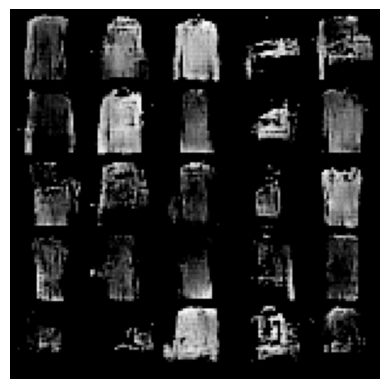

Epoch: 2/10 Steps:1875/1875	Epoch_Run_Time: 60.056632	Loss_C : -0.568984	Loss_G : -0.431446	
Epoch: 2/10 Total Steps:5625	Total_Time : 181.198585	Loss_C : -0.568984	Loss_G : -0.431446	Loss_C_Mean : -0.451912	Loss_G_Mean : -0.270398	


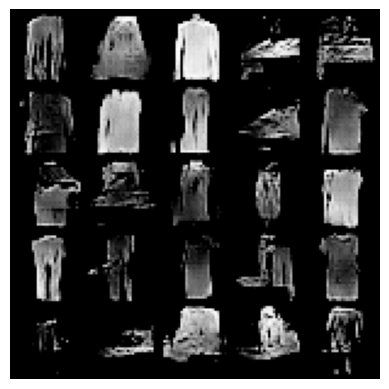

Epoch: 3/10 Steps:1875/1875	Epoch_Run_Time: 60.395804	Loss_C : -0.460273	Loss_G : -0.201652	
Epoch: 3/10 Total Steps:7500	Total_Time : 241.836522	Loss_C : -0.460273	Loss_G : -0.201652	Loss_C_Mean : -0.422743	Loss_G_Mean : -0.250251	


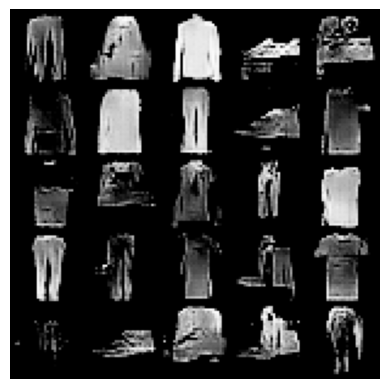

Epoch: 4/10 Steps:1875/1875	Epoch_Run_Time: 60.182762	Loss_C : -0.546653	Loss_G : -0.195126	
Epoch: 4/10 Total Steps:9375	Total_Time : 302.257595	Loss_C : -0.546653	Loss_G : -0.195126	Loss_C_Mean : -0.404123	Loss_G_Mean : -0.245308	


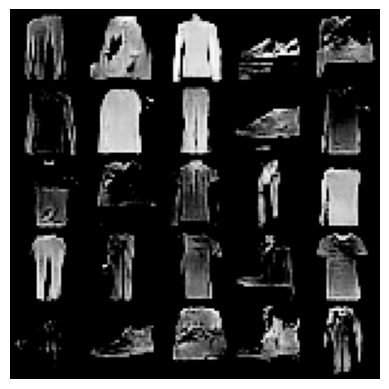

Epoch: 5/10 Steps:1875/1875	Epoch_Run_Time: 60.431126	Loss_C : -0.548396	Loss_G : -0.188384	
Epoch: 5/10 Total Steps:11250	Total_Time : 362.924645	Loss_C : -0.548396	Loss_G : -0.188384	Loss_C_Mean : -0.373835	Loss_G_Mean : -0.259372	


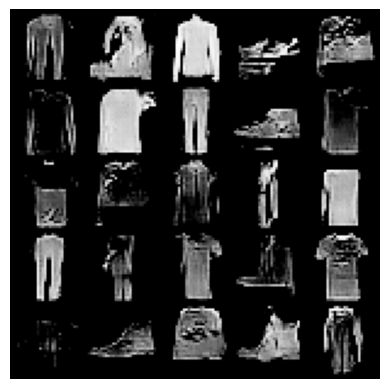

Epoch: 6/10 Steps:1875/1875	Epoch_Run_Time: 61.160176	Loss_C : -0.310712	Loss_G : -0.523511	
Epoch: 6/10 Total Steps:13125	Total_Time : 424.326934	Loss_C : -0.310712	Loss_G : -0.523511	Loss_C_Mean : -0.354604	Loss_G_Mean : -0.268341	


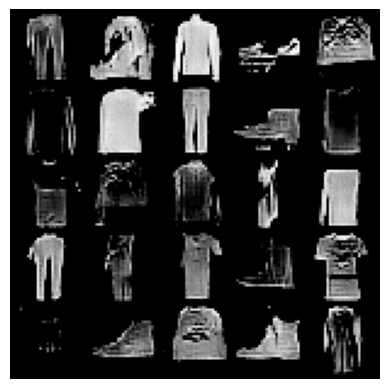

Epoch: 7/10 Steps:1875/1875	Epoch_Run_Time: 60.334276	Loss_C : -0.398469	Loss_G : -0.194509	
Epoch: 7/10 Total Steps:15000	Total_Time : 484.904611	Loss_C : -0.398469	Loss_G : -0.194509	Loss_C_Mean : -0.348104	Loss_G_Mean : -0.269002	


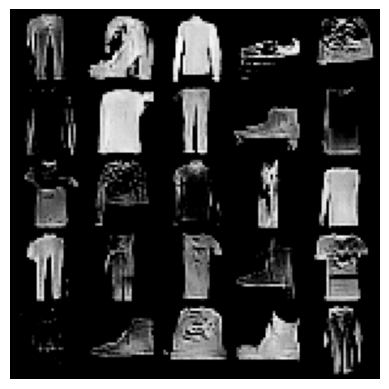

Epoch: 8/10 Steps:1875/1875	Epoch_Run_Time: 60.432729	Loss_C : -0.426762	Loss_G : -0.279807	
Epoch: 8/10 Total Steps:16875	Total_Time : 545.587595	Loss_C : -0.426762	Loss_G : -0.279807	Loss_C_Mean : -0.337067	Loss_G_Mean : -0.277372	


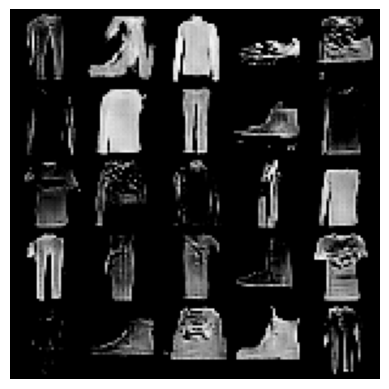

Epoch: 9/10 Steps:1875/1875	Epoch_Run_Time: 60.586311	Loss_C : -0.299980	Loss_G : -0.324176	
Epoch: 9/10 Total Steps:18750	Total_Time : 606.418208	Loss_C : -0.299980	Loss_G : -0.324176	Loss_C_Mean : -0.335831	Loss_G_Mean : -0.271403	


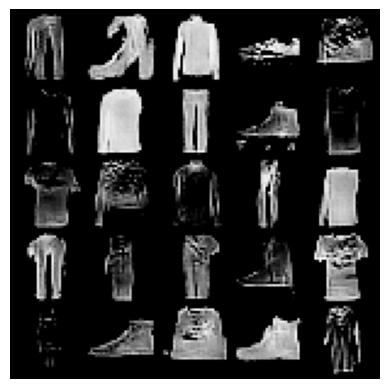

In [160]:
total_steps = 0
start_time = time.time()
cur_step = 0

generator_losses = []
critic_losses = []

C_mean_losses = []
G_mean_losses = []

crit_repeats = 5
display_step = 1800

config.num_epochs=10

print("Starting Training Loop...")
for epoch in range(config.num_epochs):
    cur_step = 0
    start = time.time()
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = torch.randn(cur_batch_size, config.nz, 1, 1, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = torch.randn(cur_batch_size, config.nz, 1, 1, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]
        
        cur_step += 1
        total_steps += 1
        
        print_val = f"Epoch: {epoch}/{config.num_epochs} Steps:{cur_step}/{len(dataloader)}\t"
        print_val += f"Epoch_Run_Time: {(time.time()-start):.6f}\t"
        print_val += f"Loss_C : {mean_iteration_critic_loss:.6f}\t"
        print_val += f"Loss_G : {gen_loss:.6f}\t"  
        print(print_val, end='\r',flush = True)

        ### Visualization code ###
        """
        if cur_step % display_step == 0 and cur_step > 0:
            print()
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                 range(num_examples // step_bins), 
                 torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                 label="Generator Loss"
             )
            plt.plot(
                 range(num_examples // step_bins), 
                 torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                 label="Critic Loss"
             )
            plt.legend()
            plt.show()
        """

    print()
    gen_mean = sum(generator_losses[-cur_step:]) / cur_step
    crit_mean = sum(critic_losses[-cur_step:]) / cur_step
    
    C_mean_losses.append(crit_mean)
    G_mean_losses.append(gen_mean)
    
    print_val = f"Epoch: {epoch}/{config.num_epochs} Total Steps:{total_steps}\t"
    print_val += f"Total_Time : {(time.time() - start_time):.6f}\t"
    print_val += f"Loss_C : {mean_iteration_critic_loss:.6f}\t"
    print_val += f"Loss_G : {gen_loss:.6f}\t"
    print_val += f"Loss_C_Mean : {crit_mean:.6f}\t"
    print_val += f"Loss_G_Mean : {gen_mean:.6f}\t"
    print(print_val)
    
    fake_noise = fixed_noise
    fake = gen(fake_noise)
    
    show_tensor_images(fake, show_fig=True,epoch=epoch)
    
    cur_step = 0




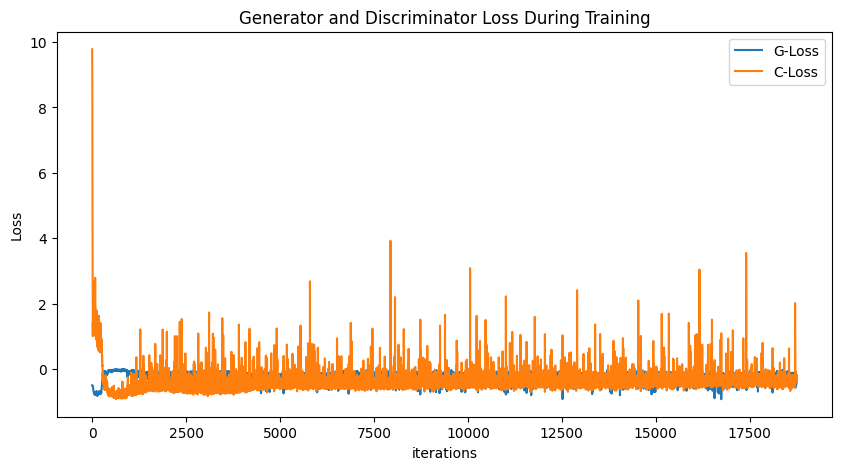

In [161]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(generator_losses,label="G-Loss")
plt.plot(critic_losses,label="C-Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

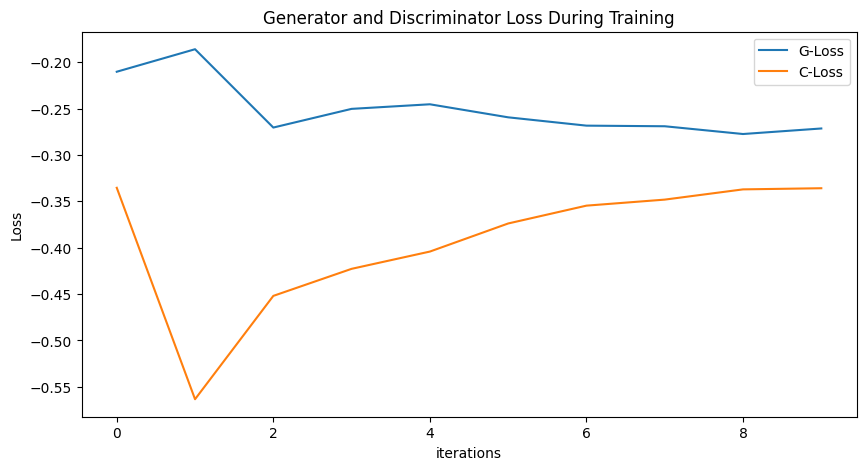

In [162]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_mean_losses,label="G-Loss")
plt.plot(C_mean_losses,label="C-Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Training Loop with conditional

In [13]:
class GeneratorConditional(nn.Module):
    def __init__(self, ngpu=config.ngpu):
        super(GeneratorConditional, self).__init__()
        self.ngpu = ngpu

        self.label_emb = nn.Embedding(10, 10)

        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(config.nz+10, config.ngf * 2, 7, 1, 0, bias=False),
            nn.BatchNorm2d(config.ngf * 2),
            nn.ReLU(True),
            # (1 - 1)*1 - 2*0 + 7
            # state size. (ngf*2) x 7 x 7
            
            nn.ConvTranspose2d(config.ngf * 2, config.ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(config.ngf),
            nn.ReLU(True),
            # (7-1)*2 - 2 + 4 = 12 - 2 + 4 = 14
            # state size. (ngf*4) x 14 x 14
            nn.ConvTranspose2d( config.ngf, config.nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # (14 - 1)*2 -2 +4 = 26 + 2 = 28
            # state size. (nc) x 28 x 28
        )

    def forward(self, input, labels):
        emb_labels = self.label_emb(labels)
        emb_labels = emb_labels.unsqueeze(2).unsqueeze(3)
        result = torch.cat([input, emb_labels], dim=1)
        return self.main(result)

In [14]:
class DiscriminatorConditional(nn.Module):
    def __init__(self, ngpu=config.ngpu):
        super(DiscriminatorConditional, self).__init__()
        self.ngpu = ngpu
        
        self.label_emb = nn.Embedding(10, 10)

        self.main = nn.Sequential(
            # input is (nc) x 28 x 28
            nn.Conv2d(config.nc+10, config.ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 14 x 14
    
            nn.Conv2d(config.ndf, config.ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(config.ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 7 x 7

            nn.Conv2d(config.ndf * 2, 1, 7, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input, labels):
        emb_labels = self.label_emb(labels)
        emb_labels = emb_labels.unsqueeze(2).unsqueeze(3)
        emb_labels = emb_labels.expand(-1, -1, input.size(2), input.size(3))

        result = torch.cat([input, emb_labels], dim=1)
        return self.main(result)

In [15]:
def get_gradient_conditional(crit, real, fake, epsilon, fake_label):

    mixed_images = real * epsilon + fake * (1 - epsilon)

    mixed_scores = crit(mixed_images, fake_label)
    
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
        
    )[0]
    return gradient

In [54]:

c_lambda = 10
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

        
gen = GeneratorConditional().to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))

crit  = DiscriminatorConditional().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

In [17]:
labels_dict = {
    0: "T-shirt/top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandal",
    6: "Shirt",
    7: "Sneaker",
    8 :"Bag",
    9: "Ankle boot",
}

In [52]:
def show_tensor_images_cond(image_tensor, labels, num_images=25, size=(1, 28, 28), show_fig=False, epoch=0):
    labels_ids = labels.detach().cpu()
    labels_ids = np.array(labels_ids)
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    
    labels_ids = labels_ids[:num_images]
    
    # Установите nrows и ncols в plt.subplots
    fig, axs = plt.subplots(5, 5, figsize=(15, 15))
    
    for i in range(5):
        for j in range(5):
            idx = i * 5 + j
            axs[i, j].imshow(image_unflat[idx].permute(1, 2, 0).squeeze(), cmap='gray')
            axs[i, j].axis('off')
            axs[i, j].set_title(f"{labels_dict.get(labels_ids[idx], 'Unknown')}")

    if show_fig:
        plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    
    plt.show()


In [56]:
fixed_labels = torch.LongTensor(np.random.randint(0, 10, config.batch_size)).cuda()
fixed_noise_conditional = torch.randn(config.batch_size, config.nz, 1, 1, device=device)

Starting Training Loop...
Epoch: 0/10 Steps:1875/1875	Epoch_Run_Time: 79.393785	Loss_C : 0.167978	Loss_G : -0.847377		
Epoch: 0/10 Total Steps:1875	Total_Time : 79.444311	Loss_C : 0.167978	Loss_G : -0.847377	Loss_C_Mean : -0.320759	Loss_G_Mean : -0.177819	


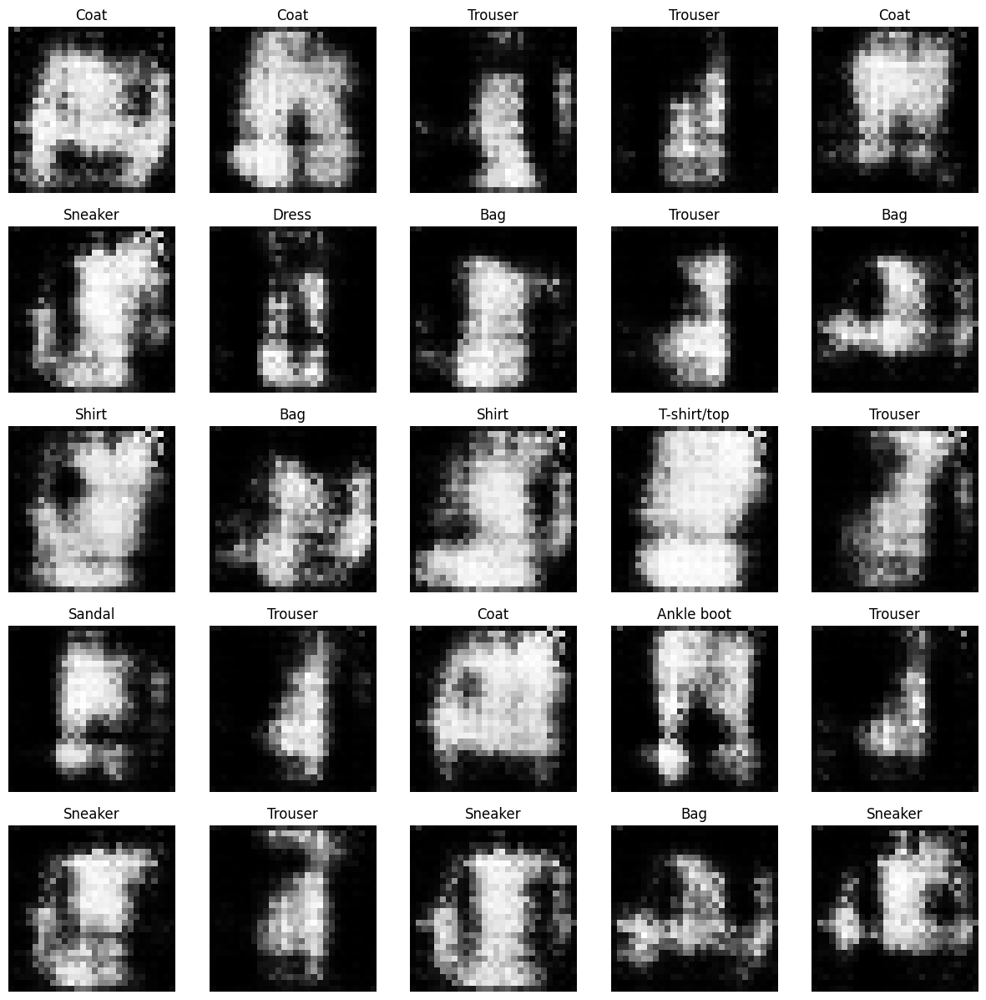

Epoch: 1/10 Steps:1875/1875	Epoch_Run_Time: 80.024271	Loss_C : -0.017453	Loss_G : -0.476628	
Epoch: 1/10 Total Steps:3750	Total_Time : 162.150821	Loss_C : -0.017453	Loss_G : -0.476628	Loss_C_Mean : -0.013644	Loss_G_Mean : -0.546140	


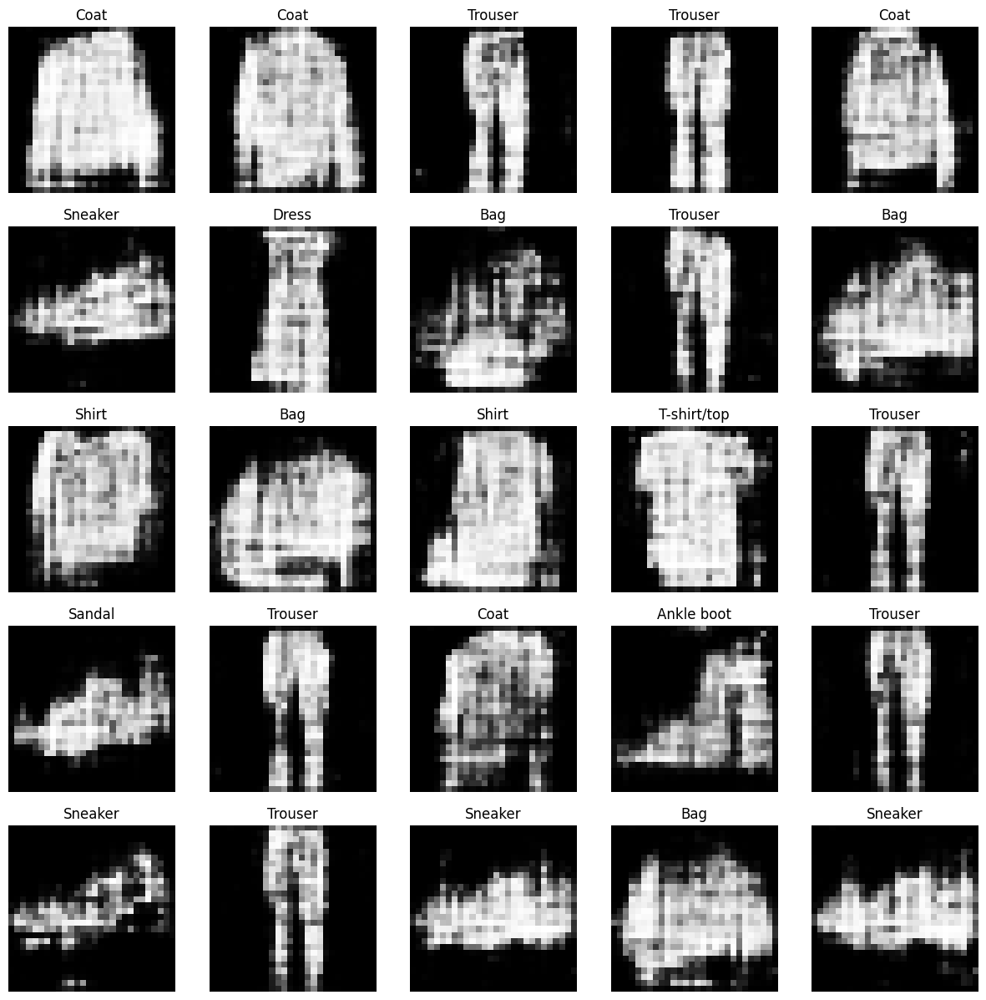

Epoch: 2/10 Steps:1875/1875	Epoch_Run_Time: 79.317897	Loss_C : -0.159375	Loss_G : -0.391469	
Epoch: 2/10 Total Steps:5625	Total_Time : 244.548548	Loss_C : -0.159375	Loss_G : -0.391469	Loss_C_Mean : -0.148160	Loss_G_Mean : -0.428537	


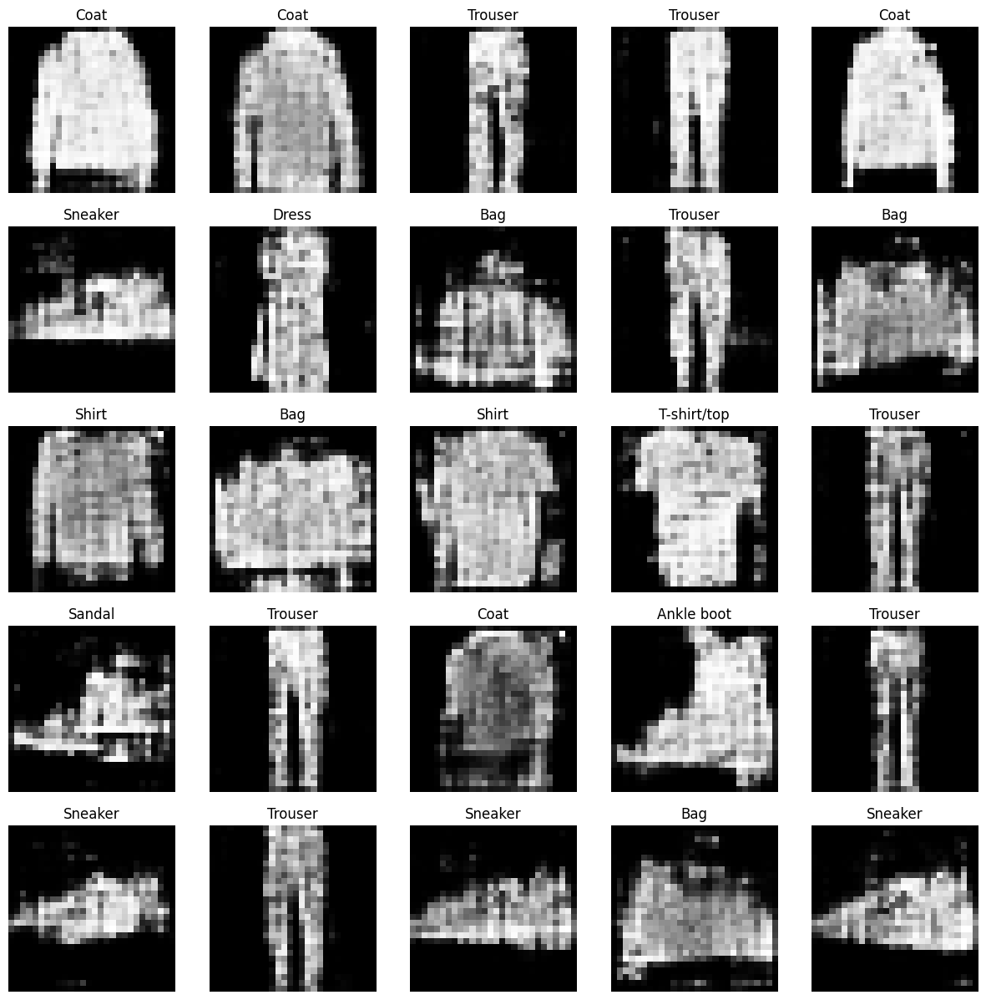

Epoch: 3/10 Steps:1875/1875	Epoch_Run_Time: 79.938983	Loss_C : -0.160946	Loss_G : -0.408158	
Epoch: 3/10 Total Steps:7500	Total_Time : 327.217799	Loss_C : -0.160946	Loss_G : -0.408158	Loss_C_Mean : -0.126681	Loss_G_Mean : -0.438152	


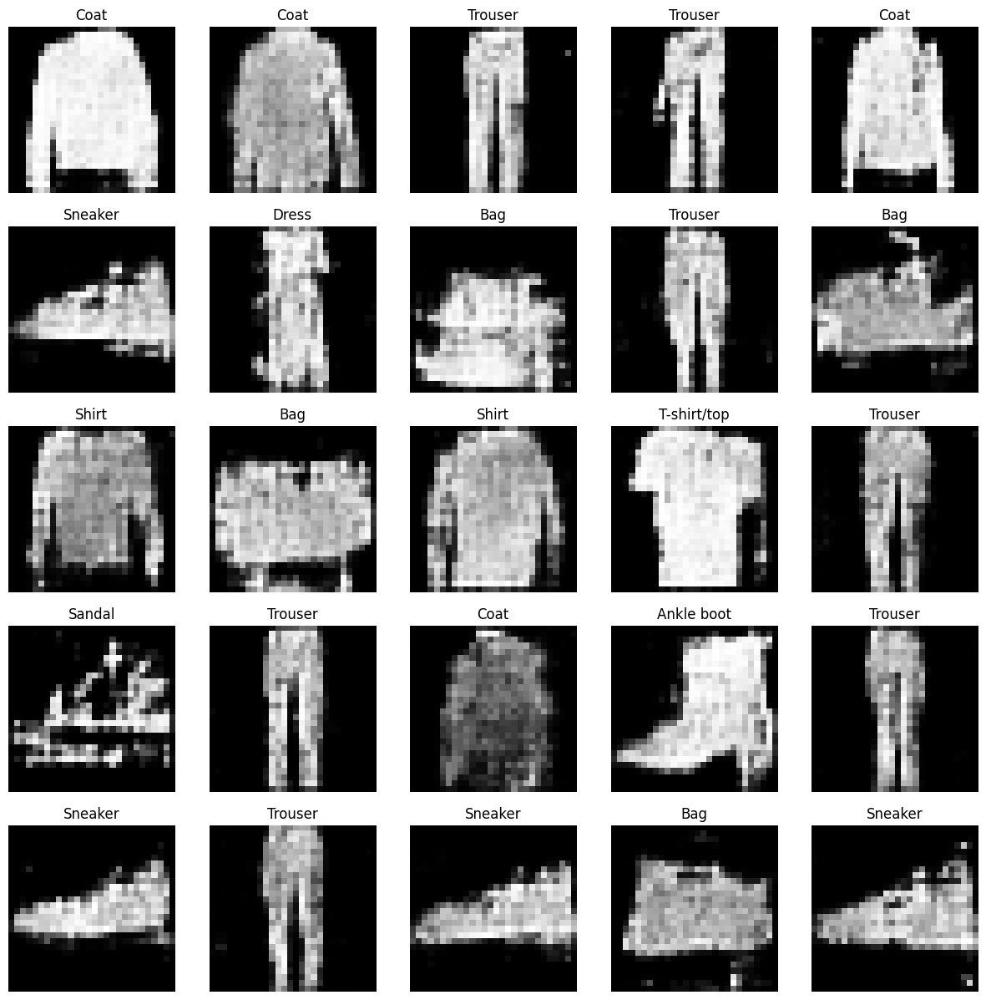

Epoch: 4/10 Steps:1875/1875	Epoch_Run_Time: 79.434959	Loss_C : -0.012563	Loss_G : -0.302540	
Epoch: 4/10 Total Steps:9375	Total_Time : 409.699412	Loss_C : -0.012563	Loss_G : -0.302540	Loss_C_Mean : -0.117073	Loss_G_Mean : -0.437629	


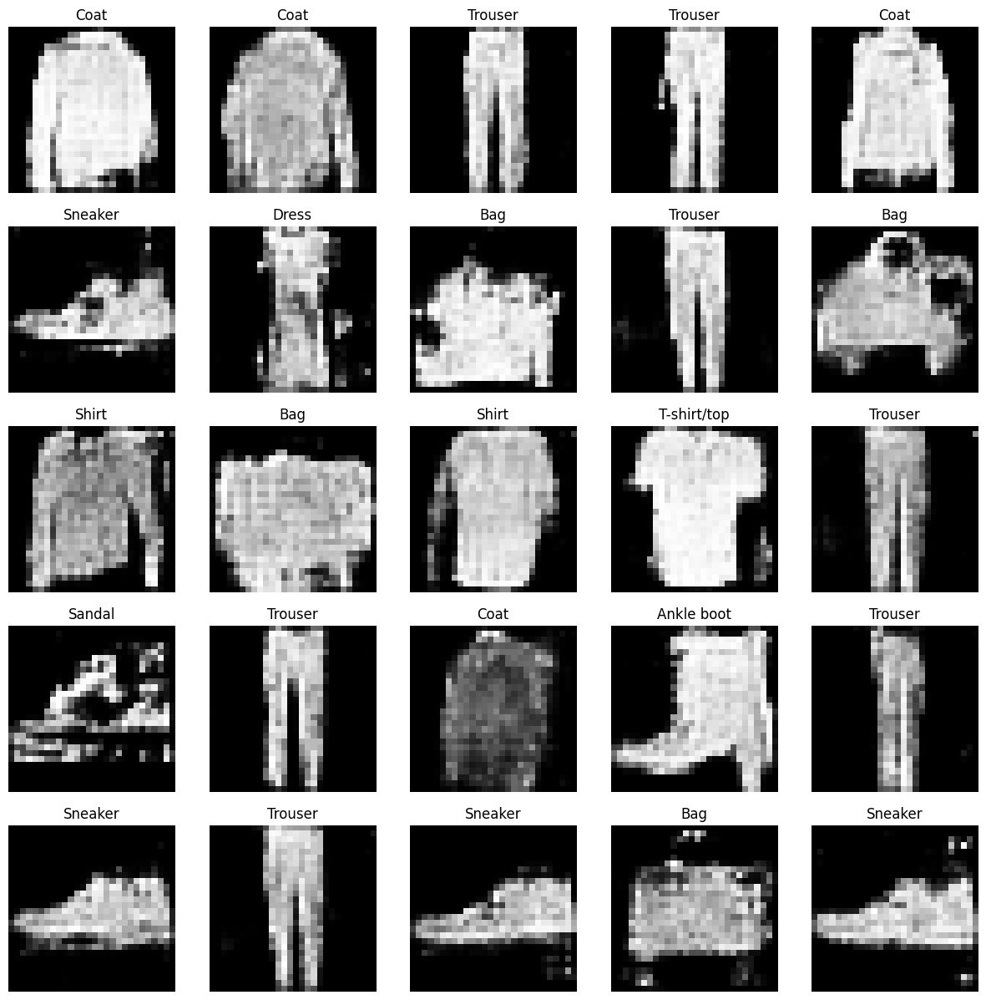

Epoch: 5/10 Steps:1875/1875	Epoch_Run_Time: 79.916065	Loss_C : -0.088522	Loss_G : -0.474447	
Epoch: 5/10 Total Steps:11250	Total_Time : 492.242369	Loss_C : -0.088522	Loss_G : -0.474447	Loss_C_Mean : -0.102712	Loss_G_Mean : -0.454678	


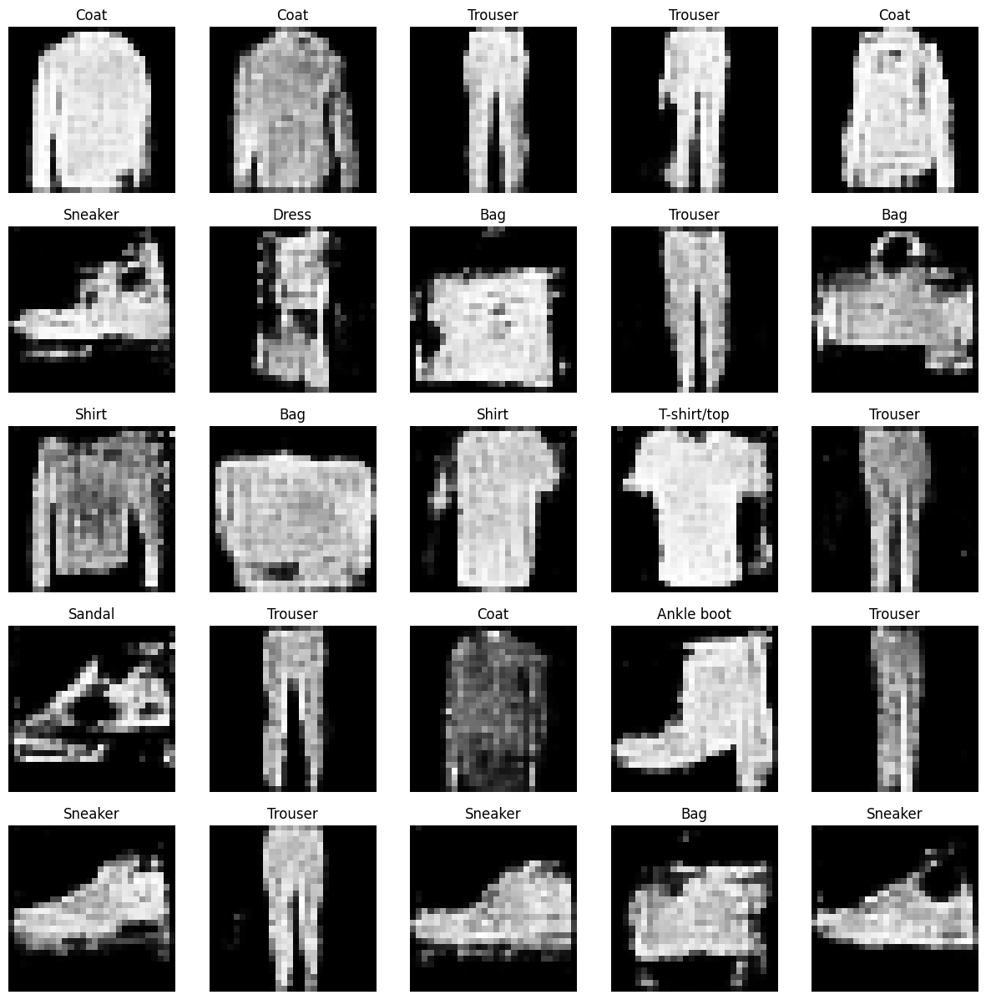

Epoch: 6/10 Steps:1875/1875	Epoch_Run_Time: 79.731960	Loss_C : -0.288809	Loss_G : -0.301416	
Epoch: 6/10 Total Steps:13125	Total_Time : 575.033674	Loss_C : -0.288809	Loss_G : -0.301416	Loss_C_Mean : -0.109792	Loss_G_Mean : -0.447628	


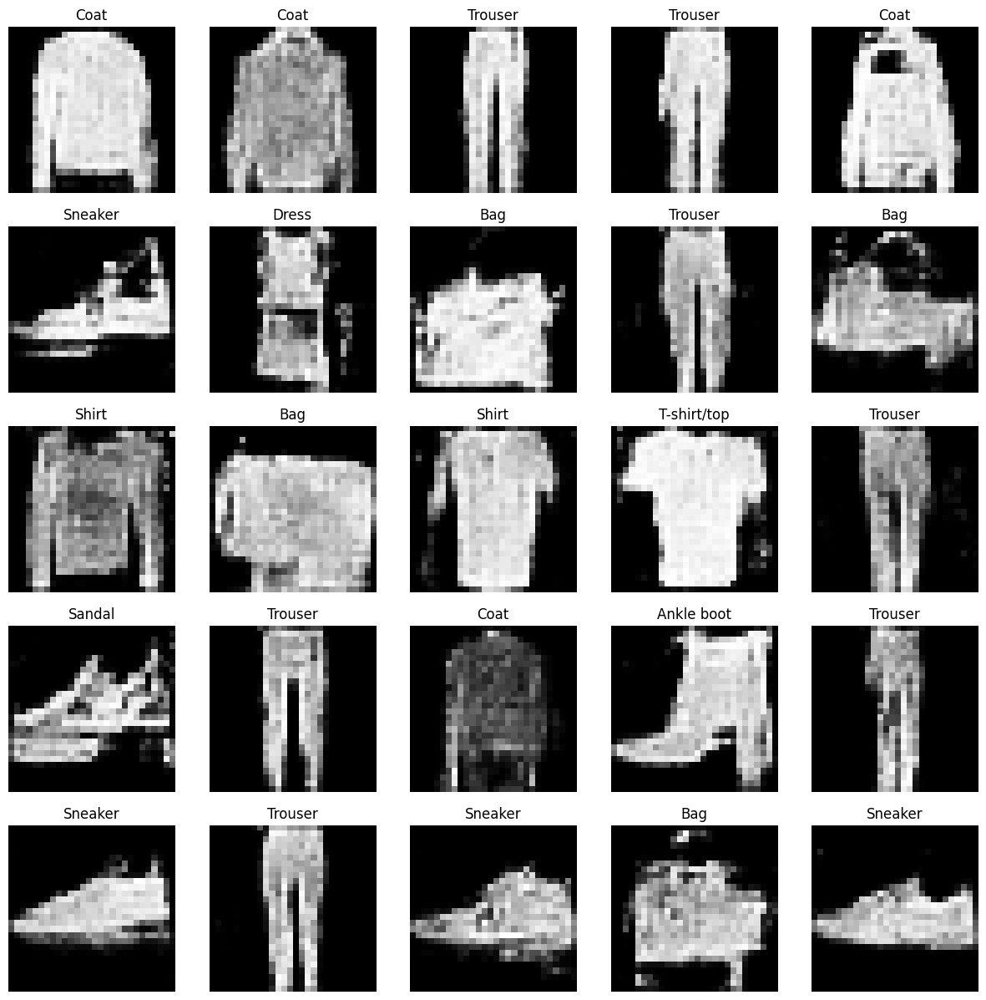

Epoch: 7/10 Steps:1875/1875	Epoch_Run_Time: 79.260567	Loss_C : 0.155049	Loss_G : -0.432766		
Epoch: 7/10 Total Steps:15000	Total_Time : 656.945978	Loss_C : 0.155049	Loss_G : -0.432766	Loss_C_Mean : -0.121990	Loss_G_Mean : -0.437959	


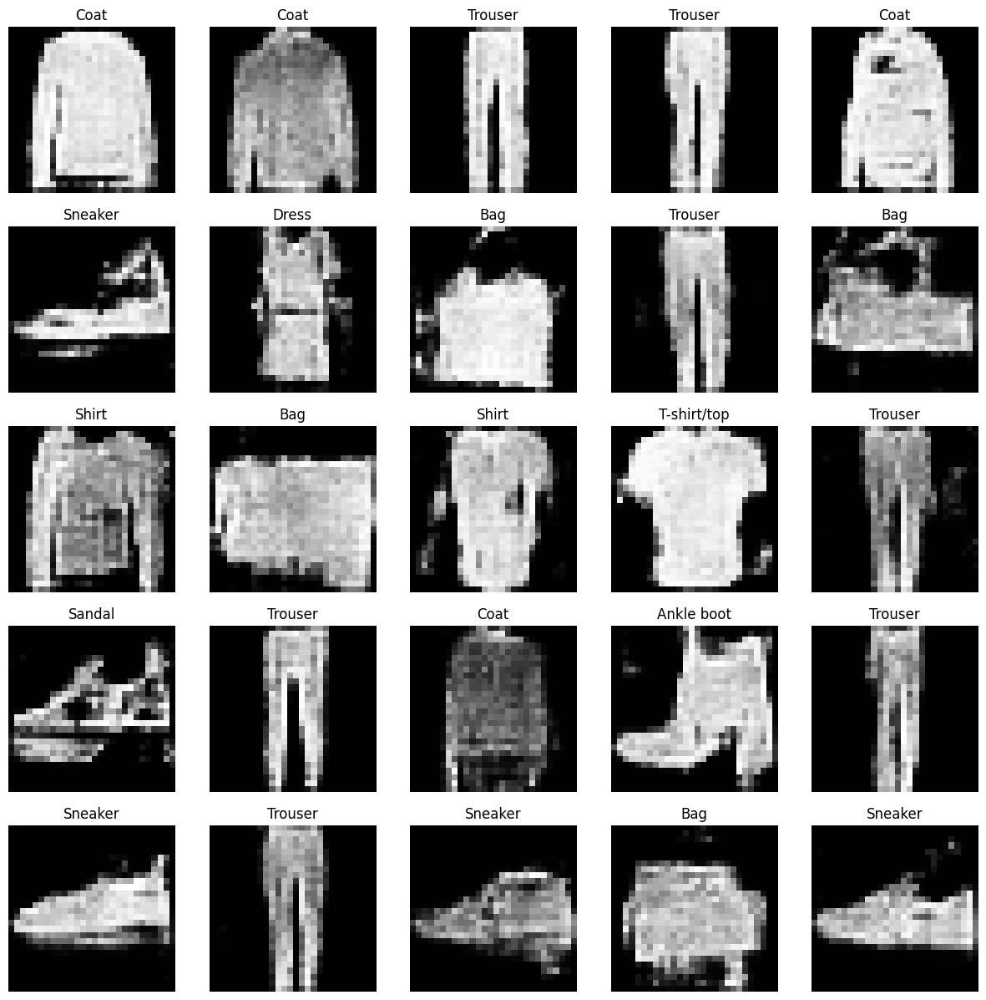

Epoch: 8/10 Steps:1875/1875	Epoch_Run_Time: 79.281812	Loss_C : -0.053318	Loss_G : -0.487940	
Epoch: 8/10 Total Steps:16875	Total_Time : 739.254163	Loss_C : -0.053318	Loss_G : -0.487940	Loss_C_Mean : -0.128331	Loss_G_Mean : -0.427010	


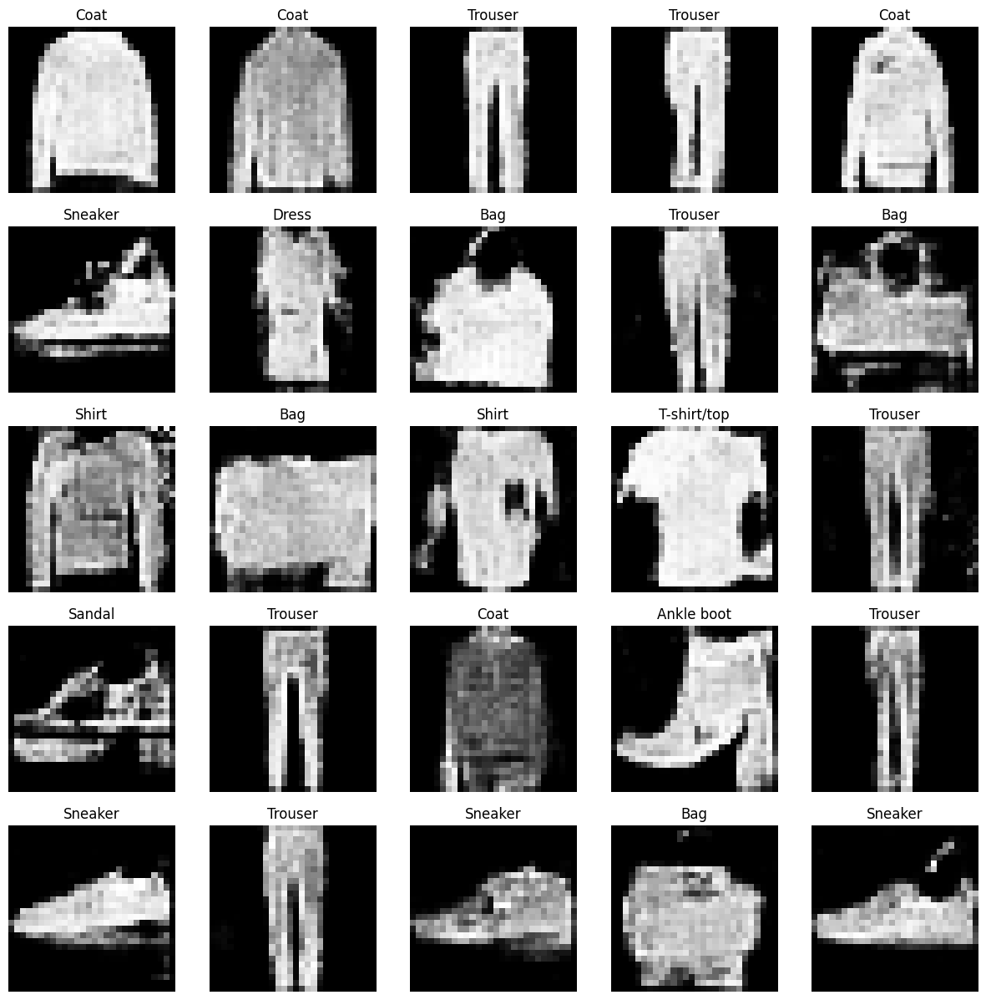

Epoch: 9/10 Steps:1875/1875	Epoch_Run_Time: 79.431823	Loss_C : -0.133851	Loss_G : -0.645160	
Epoch: 9/10 Total Steps:18750	Total_Time : 821.401834	Loss_C : -0.133851	Loss_G : -0.645160	Loss_C_Mean : -0.132140	Loss_G_Mean : -0.419020	


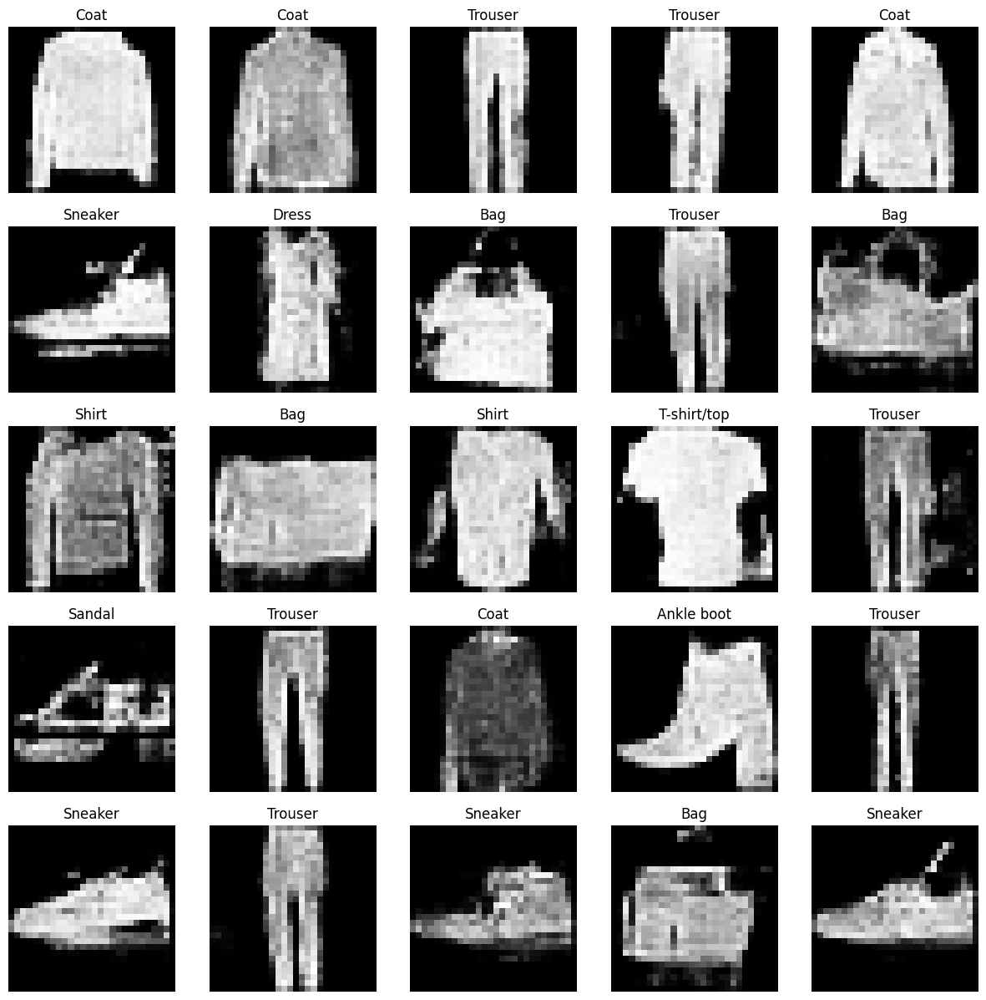

In [57]:
total_steps = 0
start_time = time.time()
cur_step = 0

generator_losses = []
critic_losses = []

C_mean_losses = []
G_mean_losses = []

crit_repeats = 5
display_step = 1800

config.num_epochs=10

print("Starting Training Loop...")
for epoch in range(config.num_epochs):
    cur_step = 0
    start = time.time()
    for real, real_label in dataloader:
        cur_batch_size = len(real)
        real = real.to(device)
        real_label = real_label.to(device)
    
        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
    
            fake_noise = torch.randn(cur_batch_size, config.nz, 1, 1, device=device)
            fake_label = torch.LongTensor(np.random.randint(0, 10, cur_batch_size)).cuda()
            fake = gen(fake_noise, fake_label)

            crit_fake_pred = crit(fake.detach(), fake_label.detach())
            crit_real_pred = crit(real, real_label)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient_conditional(crit, real, fake.detach(), epsilon, fake_label)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = torch.randn(cur_batch_size, config.nz, 1, 1, device=device)
        fake_label_2 = torch.LongTensor(np.random.randint(0, 10, cur_batch_size)).cuda()
        
        fake_2 = gen(fake_noise_2, fake_label_2)
        crit_fake_pred = crit(fake_2, fake_label_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]
        
        cur_step += 1
        total_steps += 1
        
        print_val = f"Epoch: {epoch}/{config.num_epochs} Steps:{cur_step}/{len(dataloader)}\t"
        print_val += f"Epoch_Run_Time: {(time.time()-start):.6f}\t"
        print_val += f"Loss_C : {mean_iteration_critic_loss:.6f}\t"
        print_val += f"Loss_G : {gen_loss:.6f}\t"  
        print(print_val, end='\r',flush = True)

        ### Visualization code ###
        """
        if cur_step % display_step == 0 and cur_step > 0:
            print()
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                 range(num_examples // step_bins), 
                 torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                 label="Generator Loss"
             )
            plt.plot(
                 range(num_examples // step_bins), 
                 torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                 label="Critic Loss"
             )
            plt.legend()
            plt.show()
        """

    print()
    gen_mean = sum(generator_losses[-cur_step:]) / cur_step
    crit_mean = sum(critic_losses[-cur_step:]) / cur_step
    
    C_mean_losses.append(crit_mean)
    G_mean_losses.append(gen_mean)
    
    print_val = f"Epoch: {epoch}/{config.num_epochs} Total Steps:{total_steps}\t"
    print_val += f"Total_Time : {(time.time() - start_time):.6f}\t"
    print_val += f"Loss_C : {mean_iteration_critic_loss:.6f}\t"
    print_val += f"Loss_G : {gen_loss:.6f}\t"
    print_val += f"Loss_C_Mean : {crit_mean:.6f}\t"
    print_val += f"Loss_G_Mean : {gen_mean:.6f}\t"
    print(print_val)
    
    fake_noise = fixed_noise_conditional
    fake = gen(fake_noise, fixed_labels)
    
    show_tensor_images_cond(fake, fixed_labels, show_fig=True,epoch=epoch)
    
    cur_step = 0




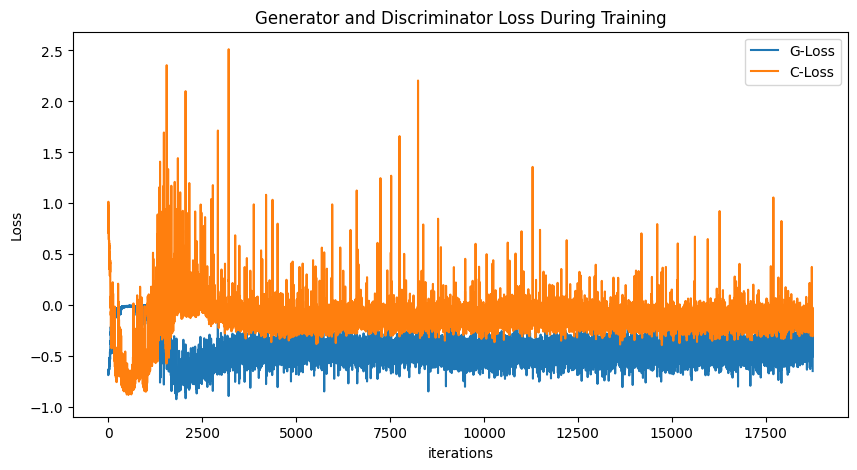

In [58]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(generator_losses,label="G-Loss")
plt.plot(critic_losses,label="C-Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

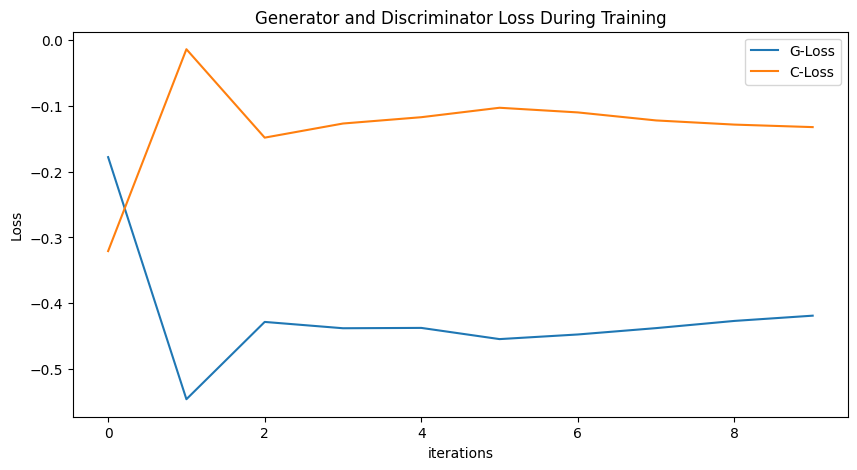

In [59]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_mean_losses,label="G-Loss")
plt.plot(C_mean_losses,label="C-Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# **Очёт**

> **Использовал архитектуру DCGAN**

>> Изменил архитектуру с семинара, чтобы мой размер картинки подходил: разобрался как считать state_size, пересчитал всё под свои размеры.


>**Добавил weight_cliping**
>> Попробовал разные способы clipping до/после step

>> Попробовал добавить clipping для генератора

>**Добавил gradient_penalty**

>> Сталкнулся с проблемой: сеть не обучалась при размере батча 128 (менял гипперпараметры, но всё четно), получислось достичь наилучшего результата, когда понизил батч до 32 и использовал размер латентного простарнства шума 100, а не 50, как при weight_cliping

>> Результаты получились более выразительнее и детальнее, чем при weight_cliping, однако обучение занимает больше времени

> **Добавил генерацию с условием**

>> Использовал добавление эмбедингов метки класса в каналы исходного тензора для генератора и дескриминатора

>> Качество за 10 эпох получилось хуже, скорее всего это связано с подмешиванием в каналы эмбедингов меток класса)

------------------------------------------------------------------------------------------------------
## **Результаты**
### Сlipping только у **дескриминатора**

> Сначала добавил clipping до step  два раза: псоле бекворда на real_data и после бекворда на fake_data; но кажется это было ошибкой(

> Попробывал добавить clipping после step (как в статье). Результаты за 10 эпох:


![loss_clipp_after_step](./report/loss_clipp_after_step.png)

![example_clipp_after_step](./report/example_clipp_after_step.png)


> Попробывал добавить clipping до step. Результаты за 10 эпох:


![loss_clipp_befor_step](./report/loss_clipp_befor_step.png)


![example_clipp_befor_step](./report/example_clipp_befor_step.png)

#### Вывод 
Сlipping после step показывает лучше результаты) Предсказуемо

### Сlipping у **дескриминатора** и у **генератора**


> clipping до step. Результаты за 20 эпох:

![example_clipp_dg_befor_step20](./report/example_clipp_dg_befor_step20.png)

> clipping после step. Результаты за 20 эпох:

![loss_clipp_dg_after_step20](./report/loss_clipp_dg_after_step20.png)


![example_clipp_dg_after_step20](./report/example_clipp_dg_after_step20.png)

#### Вывод 
Сlipping после step показывает лучше результаты) Предсказуемо, а добавление липшицевости генератору кажется ничего не дало, возможно обучение стало стабильнее, но это не очень заметно

### Penalty-grad

> Обучал 10 эпох алогитмом, как в [статье](https://arxiv.org/pdf/1704.00028v3.pdf):

**loss**:

![penalty_10_epoh_loss](./report/penalty_10_epoh_loss.png)

**loss_mean**:

![penalty_10_epoh_loss_mean](./report/penalty_10_epoh_loss_mean.png)

![penalty_10_epoh_example](./report/penalty_10_epoh_example.png)

### Условие на метку

> Обучал 10 эпох:

**loss**:

![cond_loss](./report/cond_loss.png)

**loss_mean**:

![cond_loss_mean](./report/cond_loss_mean.png)

![cond_example](./report/cond_example.png)